# YOLOv9 - Training on Custom Dataset

## Environment Setup

First, we set up the environment in Google Colab and install the necessary dependencies.

In [1]:
!nvidia-smi

Wed Sep 11 02:38:28 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Clone the YOLOv9 repository
!git clone https://github.com/carlosfab/yolov9.git

# Change the current working directory to the cloned YOLOv9 repository
%cd yolov9

# Install the necessary dependencies for YOLOv9 from the requirements.txt file
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 372, done.
remote: Total 372 (delta 0), reused 0 (delta 0), pack-reused 372 (from 1)
Receiving objects: 100% (372/372), 2.54 MiB | 5.33 MiB/s, done.
Resolving deltas: 100% (186/186), done.
/content/yolov9
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.4 MB/s eta 0:00:00


In [3]:
# Import necessary libraries
import sys
import os
import requests
from tqdm.notebook import tqdm
from pathlib import Path
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
from IPython.display import display, Image
from PIL import Image as PILImage

# Configuration of directories for code and data
CODE_FOLDER = Path(".").resolve()  # Code directory
WEIGHTS_FOLDER = CODE_FOLDER / "weights"  # Directory for model weights
DATA_FOLDER = CODE_FOLDER / "data"  # Directory for data

# Create directories for weights and data if they don't exist
WEIGHTS_FOLDER.mkdir(exist_ok=True, parents=True)
DATA_FOLDER.mkdir(exist_ok=True, parents=True)

# Add the code directory to Python's path for module import
sys.path.append(str(CODE_FOLDER))

rcParams['figure.figsize'] = 15, 15
%matplotlib inline

In [4]:
# URLs of weight files
weight_files = [
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt",
    "https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt"
]

# Iterate over the list of URLs to download the weight files
for i, url in enumerate(weight_files, start=1):
    filename = url.split('/')[-1]
    response = requests.get(url, stream=True)
    total_size_in_bytes = int(response.headers.get('content-length', 0))
    block_size = 1024  # 1 Kilobyte
    progress_bar = tqdm(total=total_size_in_bytes, unit='iB', unit_scale=True, desc=f"Downloading file {i}/{len(weight_files)}: {filename}")
    with open(WEIGHTS_FOLDER / filename, 'wb') as file:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            file.write(data)
    progress_bar.close()

## Dataset Overview: "Formula One Detect"



In [5]:
# Installation of the Roboflow library without displaying unnecessary logs
!pip install -q roboflow

# Importing the Roboflow library
import roboflow

# Authentication to Roboflow
roboflow.login()  # Note: Make sure to set up your Roboflow API key before calling login()

# Initializing the Roboflow client
rf = roboflow.Roboflow(api_key="9Xz9fPOwnyoUWeanbo0Y")

# Accessing the specific project and downloading the desired version of the dataset for YOLOv9
project = rf.workspace("jayanths-workspace").project("formula-one-car-detection")
dataset = project.version(1).download("yolov9")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.6 MB/s eta 0:00:00
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Formula-One-Car-Detection--1 in yolov9:: 100%|██████████| 15226/15226 [00:02<00:00, 6843.87it/s]


## Model Training

In [6]:
!python train.py \
--batch 16 --epochs 20 --img 640 --device 0 --min-items 0 \
--data {dataset.location}/data.yaml \
--weights {WEIGHTS_FOLDER}/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

2024-09-11 02:41:35.183770: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-11 02:41:35.203615: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-11 02:41:35.209474: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-11 02:41:35.223554: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-11 02:41:36.408642: W tensorflow/compiler/tf2

## Save and Load Training Weights (Optional)

During or after training in Google Colab, it's common to encounter the challenge of disconnections after a period of inactivity or upon reaching the maximum continuous usage limit.

This can result in the loss of training progress and, consequently, the need to restart training from scratch.

To mitigate this problem and ensure continuity of work, it's recommended to save the weights of the trained model to Google Drive.

### Save Weights to Google Drive

To save weights to Google Drive, you first need to mount Google Drive in the Colab environment. This can be done using the `google.colab` library and the `drive.mount('/content/drive')` method, which will prompt for authentication and allow access to your Google Drive files as if they were local.

After mounting the drive, you can specify the path on Google Drive where you want to save the weights. When setting up your model training, ensure that checkpoints are saved in this directory. Many deep learning frameworks, such as TensorFlow and PyTorch, offer callbacks or settings to automatically save weights during training.

In [8]:
from google.colab import drive
import shutil

# # Mount Google Drive
drive.mount('/content/drive')

# # Define the source and destination paths
source_path = f'{CODE_FOLDER}/runs'
destination_path = '/content/drive/MyDrive/yolov9-formula-one'

# # Check if the destination directory exists; if so, remove it
if os.path.exists(destination_path):
  shutil.rmtree(destination_path)

# # Copy the content from Google Drive to the Colab environment
shutil.copytree(source_path, destination_path)
print("Training weights copied to Google Drive successfully.")

Mounted at /content/drive
Training weights copied to Google Drive successfully.


### Load Weights to Continue Training

When you need to resume training, you can easily load the saved weights from Google Drive into your model. This is done by specifying the path to the saved weights when setting up the model for training. When starting training, the model will continue from the loaded weights, allowing for a smooth transition and continuation of progress without interruptions.

This practice not only saves time and computational resources but also facilitates experimentation with different hyperparameter settings, model architectures, and datasets, making the machine learning model development process more efficient and less susceptible to unwanted interruptions.

In [ ]:
from google.colab import drive
import shutil

# Mount Google Drive
drive.mount('/content/drive')

# Define the source and destination paths
# Replace 'destination_path' with the path in Google Drive where the weights were saved
source_path = '/content/drive/MyDrive/yolov9-formula-one'
destination_path = f'{CODE_FOLDER}/runs'

# Check if the source contains the necessary files, if yes, copy them back to Colab
if os.path.exists(source_path):
    shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
    print("Training weights loaded from Google Drive successfully.")
else:
    print("Weights directory not found on Google Drive.")

Mounted at /content/drive
Pesos do treinamento carregados do Google Drive com sucesso.


In [ ]:
!ls {CODE_FOLDER}/runs

train


# Training Results Analysis

The results of each training session are automatically stored in `{CODE_FOLDER}/runs/train/`, within sequential folders `exp`, `exp2`, ...

In [10]:
from prettytable import PrettyTable
import time

# Path of the directory you want to list
directory_path = f'{CODE_FOLDER}/runs/train/exp'

# Create a pretty table
table = PrettyTable()
table.field_names = ["Filename", "Size (KB)", "Modification Date"]

# List files in the directory
for filename in os.listdir(directory_path):
    filepath = os.path.join(directory_path, filename)
    if os.path.isfile(filepath):
        # Get the file size
        size = os.path.getsize(filepath) / 1024  # Size in KB
        # Get the modification date
        mod_time = os.path.getmtime(filepath)
        mod_time = time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(mod_time))
        # Add row to the table
        table.add_row([filename, f"{size:.2f}", mod_time])

# Sort the table by filename (optional)
table.sortby = "Filename"

# Display the table
print(table)

+----------------------------------------------------+-----------+---------------------+
|                      Filename                      | Size (KB) |  Modification Date  |
+----------------------------------------------------+-----------+---------------------+
|                    F1_curve.png                    |   170.92  | 2024-09-11 04:40:48 |
|                    PR_curve.png                    |   118.26  | 2024-09-11 04:40:49 |
|                    P_curve.png                     |   145.45  | 2024-09-11 04:40:49 |
|                    R_curve.png                     |   155.81  | 2024-09-11 04:40:49 |
|                confusion_matrix.png                |   126.83  | 2024-09-11 04:40:49 |
| events.out.tfevents.1726022497.ea6aca2327f4.1889.0 |  1843.98  | 2024-09-11 04:40:58 |
|                      hyp.yaml                      |    0.37   | 2024-09-11 02:41:37 |
|                     labels.jpg                     |   216.33  | 2024-09-11 02:41:52 |
|               label

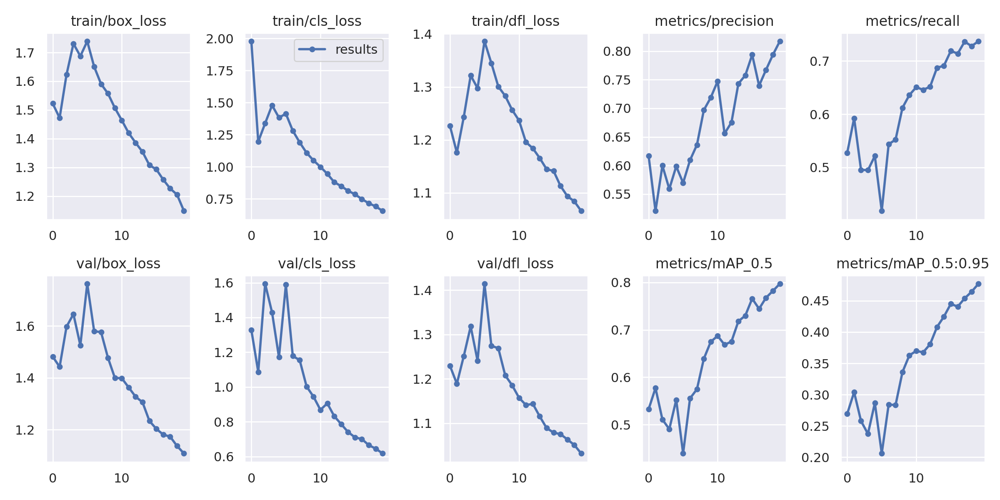

In [ ]:
# Path to the 'results.png' image
results_image_path = f'{CODE_FOLDER}/runs/train/exp/results.png'

# Display the image with a specific size
Image(filename=results_image_path, width=800)

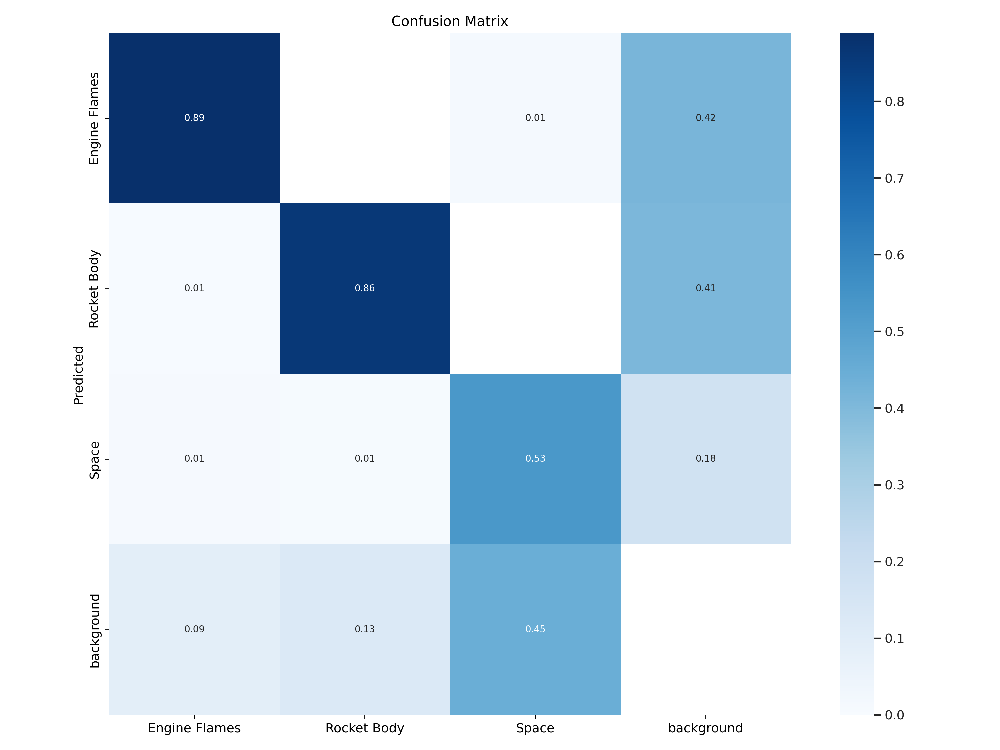

In [ ]:
# Path to the 'confusion_matrix.png' image
results_image_path = f'{CODE_FOLDER}/runs/train/exp/confusion_matrix.png'

# Display the image with a specific size
Image(filename=results_image_path, width=800)

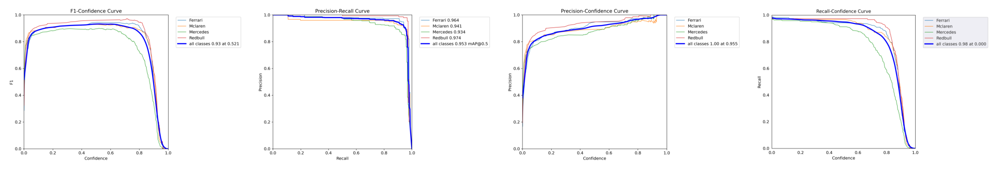

In [11]:
# Path to the directory containing metric images
metrics_folder = os.path.join(CODE_FOLDER, 'runs/train/exp')

# List of filenames of the main metrics to be displayed
metrics_files = ['F1_curve.png', 'PR_curve.png', 'P_curve.png', 'R_curve.png']

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, len(metrics_files), figsize=(20, 4))

# Loop to display each image in the corresponding subplot
for ax, metric_file in zip(axs, metrics_files):
    img_path = os.path.join(metrics_folder, metric_file)
    img = PILImage.open(img_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

## Validate Custom Model

In [12]:
!python val.py \
--img 640 --batch 32 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights {CODE_FOLDER}/runs/train/exp/weights/best.pt

val: data=/content/yolov9/Formula-One-Car-Detection--1/data.yaml, weights=['/content/yolov9/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLO 🚀 6b38221 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

/content/yolov9/models/experimental.py:243: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functio

## Inference with Custom Model

In [13]:
!python detect.py \
  --img 1280 --conf 0.1 --device 0 \
  --weights {CODE_FOLDER}/runs/train/exp/weights/best.pt \
  --source {DATA_FOLDER}/_through_goes_Hamilton.mp4

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/data/_through_goes_Hamilton.mp4, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 6b38221 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

/content/yolov9/models/experimental.py:243: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future 

In [14]:
from moviepy.editor import VideoFileClip

# Path to the processed video
processed_video_path = f"{CODE_FOLDER}/runs/detect/exp/_through_goes_Hamilton.mp4"

# Load the video using MoviePy
clip = VideoFileClip(processed_video_path)

# Display the video in the notebook with adjusted width
clip.ipython_display(width=600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
